# Data viewer

The following script reads and displays different Clarius data types.

## Reading RF data

The following script reads sample rf data from a file and store them into memory.

In [54]:
import numpy as np

# locate the path and filename
path = "../data/wirephantom/"
filename = "phantom_rf.raw"

# reading header information and RF data
hdr_info = ('id', 'frames', 'lines', 'samples', 'samplesize')
hdr, timestamps, data = {}, None, None
print("Reading data ", end="")
with open(path + filename, 'rb') as raw_bytes:
    # read 4 bytes header info
    for info in hdr_info:
        hdr[info] = int.from_bytes(raw_bytes.read(4), byteorder='little')
    sz = hdr['lines'] * hdr['samples'] * hdr['samplesize']
    # read timestamp and data
    timestamps = np.zeros(hdr['frames'], dtype='int64')
    data = np.zeros((hdr['lines'], hdr['samples'], hdr['frames']), dtype='int16')
    for frame in range(hdr['frames']):
        print(".", end="")
        # 8 bytes of timestamp
        timestamps[frame] = int.from_bytes(raw_bytes.read(8), byteorder='little')
        # read each frame
        data[:, :, frame] = np.frombuffer(raw_bytes.read(sz), dtype='int16').reshape([hdr['lines'], hdr['samples']])
print("Done!")
print('Loaded {d[2]} frames of data: {d[0]} lines x {d[1]} RF samples'.format(d=data.shape))

Reading data .............Done!
Loaded 13 frames of data: 192 lines x 3120 RF samples


## Displaying RF data

The following script displays the rf frames. It also uses a basic hilbert transform to generate the corresponding b mode images.


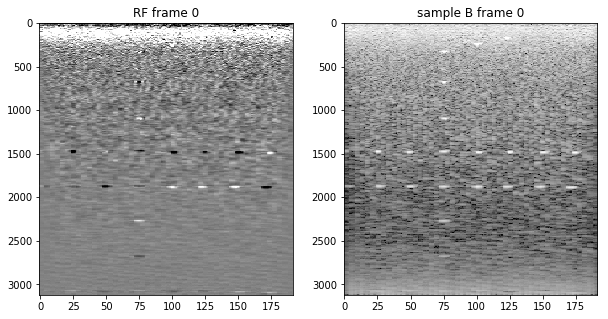

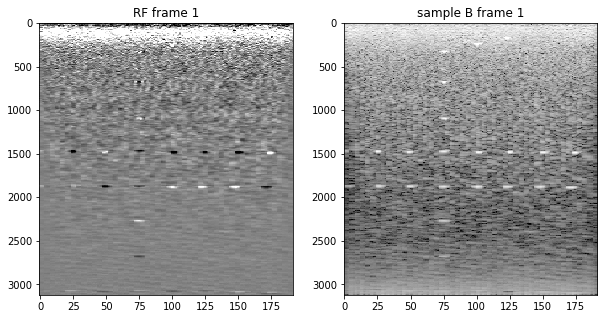

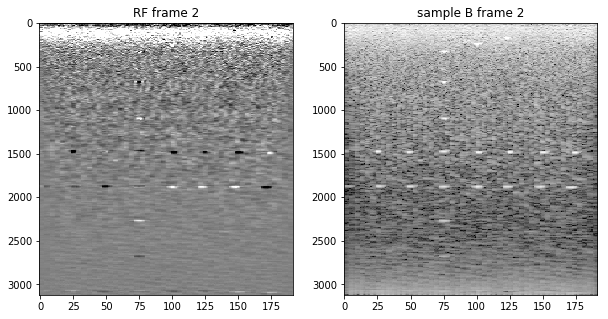

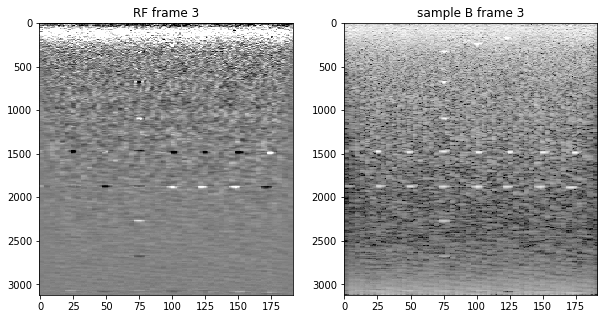

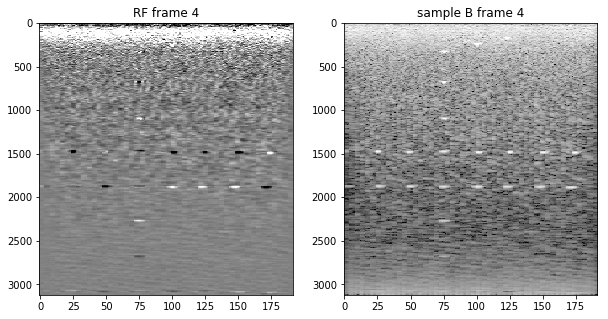

...

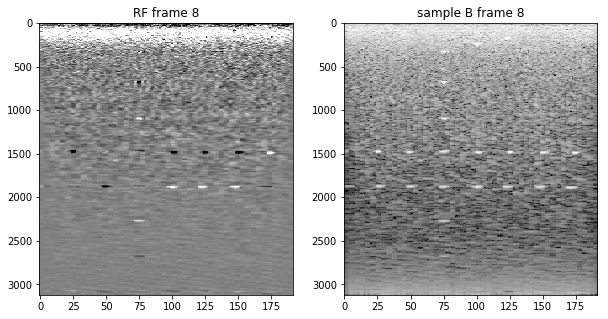

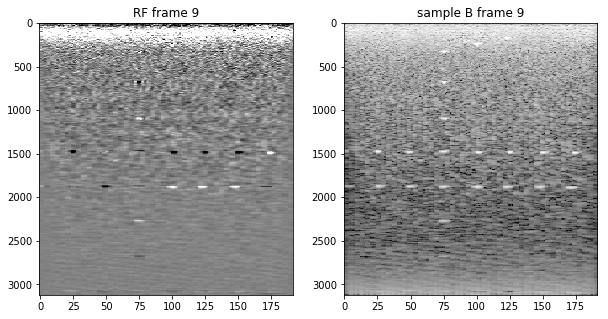

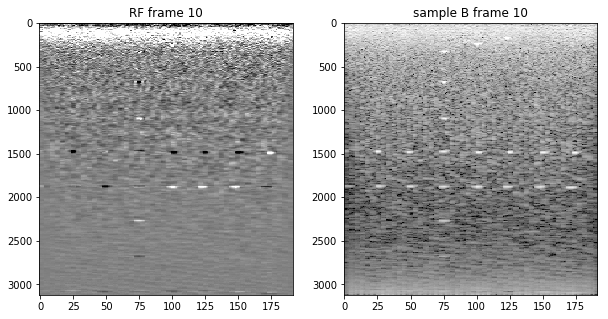

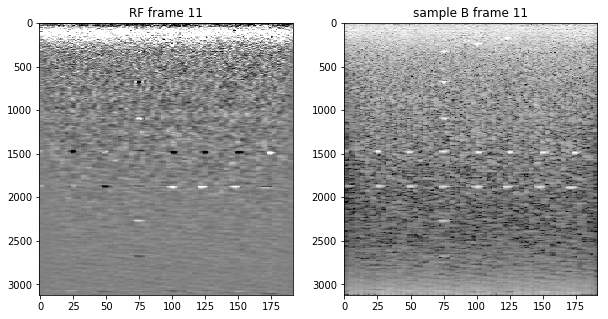

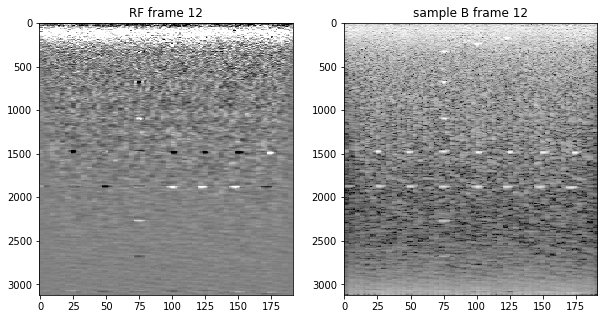

In [49]:
from scipy.signal import hilbert
import matplotlib.pyplot as plt

numframes = hdr['frames']

# covnert RF to B 
bdata = np.zeros((hdr['lines'], hdr['samples'], hdr['frames']), dtype='float')
for frame in range(numframes):
    bdata[:,:,frame] = 20 * np.log10( np.abs(1 + hilbert(data[:,:,frame])) )

# display images
for frame in range(numframes):
    plt.figure(figsize=(10,5))
    
    plt.subplot(1,2,1)
    plt.imshow(np.transpose(data[:,:,frame]), cmap=plt.cm.gray, aspect='auto', vmin=-1000, vmax=1000 )
    plt.title('RF frame ' + str(frame))
    
    plt.subplot(1,2,2)
    plt.imshow(np.transpose(bdata[:,:,frame]), cmap=plt.cm.gray, aspect='auto', vmin=15, vmax=70 )
    plt.title('sample B frame ' + str(frame))
    
    
    plt.show()

## Reading IQ data

The following script reads sample IQ data from a file and store them into memory.

In [50]:
# locate the path and filename
path = "../data/wirephantom/"
filename = "phantom_iq.raw"

# reading header information and RF data
hdr_info = ('id', 'frames', 'lines', 'samples', 'samplesize')
hdr, timestamps, data = {}, None, None
print("Reading data ", end="")
with open(path + filename, 'rb') as raw_bytes:
    # read 4 bytes header info
    for info in hdr_info:
        hdr[info] = int.from_bytes(raw_bytes.read(4), byteorder='little')
    sz = hdr['lines'] * hdr['samples'] * hdr['samplesize'] 
    #need to read timestamp + both i and q
    timestamps = np.zeros(hdr['frames'], dtype='int64')
    iqdata = np.zeros((hdr['lines'], hdr['samples']*2, hdr['frames']), dtype='int16')
    for frame in range(hdr['frames']):
        print(".", end="")
        # 8 bytes of timestamp
        timestamps[frame] = int.from_bytes(raw_bytes.read(8), byteorder='little')
        # read each frame
        iqdata[:, :, frame] = np.frombuffer(raw_bytes.read(sz), dtype='int16').reshape([hdr['lines'], hdr['samples']*2])
print("Done!")
print('Loaded {d[2]} frames of data: {d[0]} lines x {d[1]} IQ samples'.format(d=iqdata.shape))

# separating i and q data
idata = iqdata[:,0::2,:]
qdata = iqdata[:,1::2,:]


Reading data ................Done!
Loaded 16 frames of data: 384 lines x 1568 IQ samples


## Displaying IQ data

The following script displays the iq frames. It also generates and displays the corresponding b mode images.

/Users/rezazahiri/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in log10
  import sys


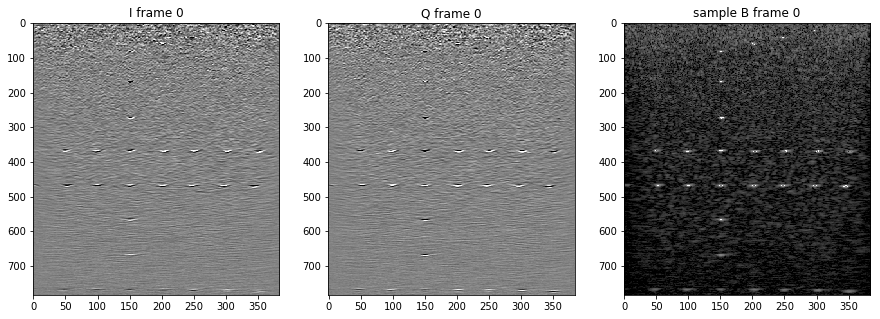

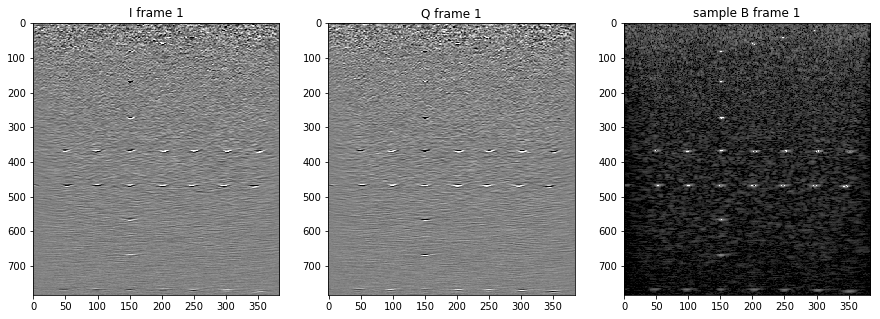

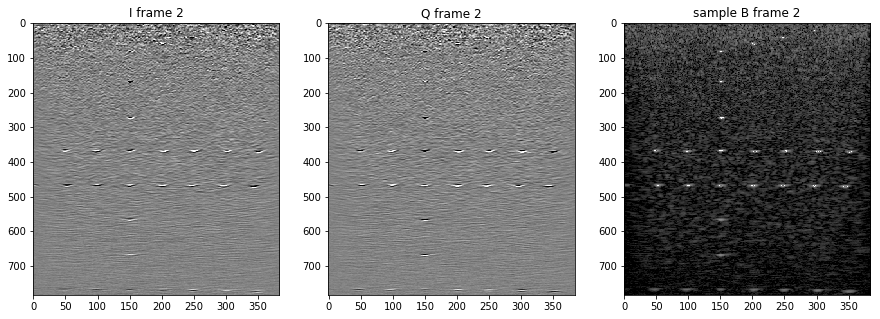

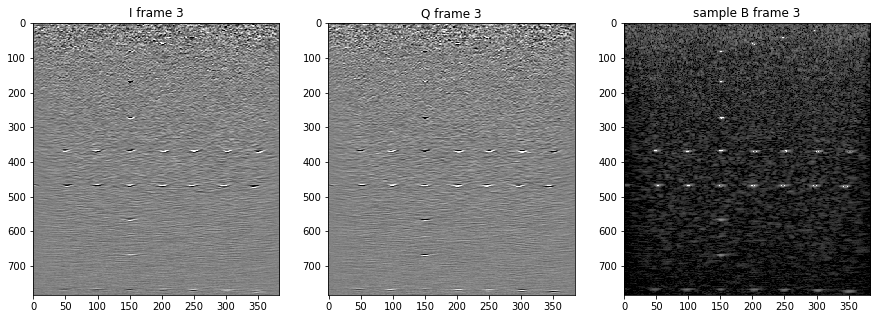

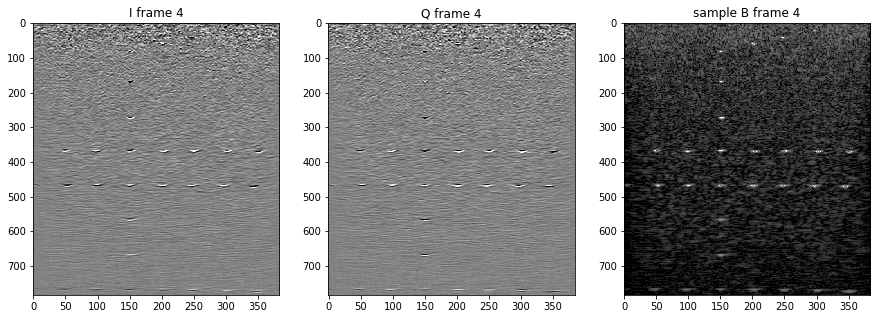

...

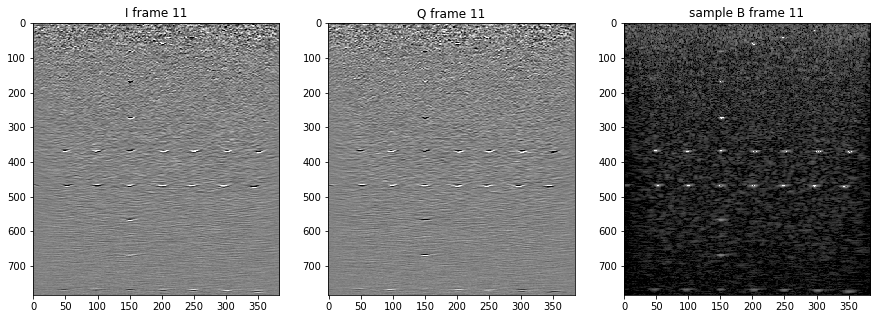

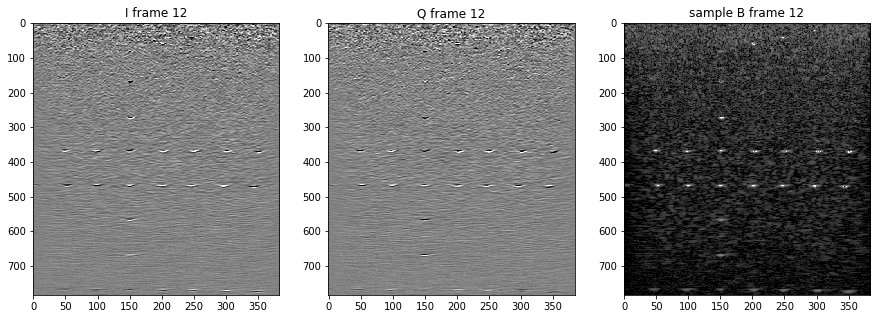

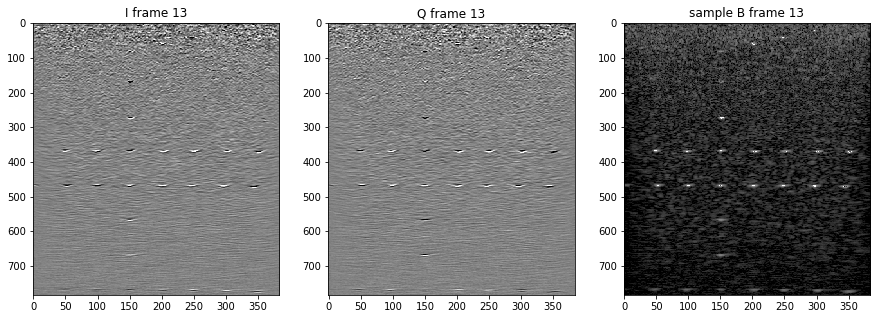

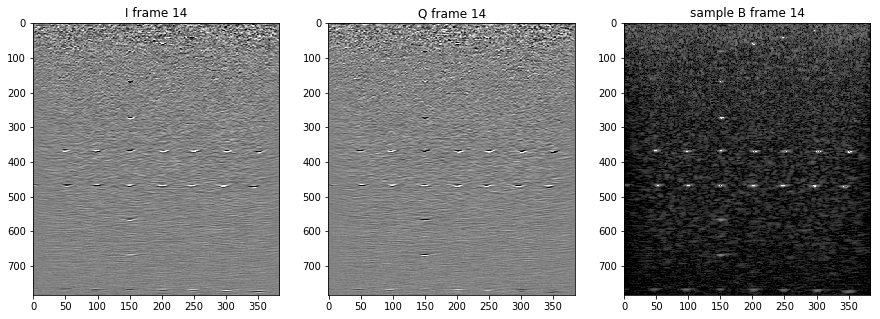

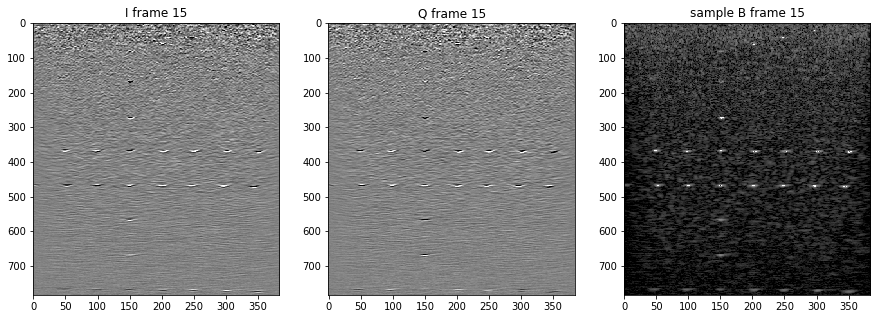

In [51]:
# display iq data
numframes = hdr['frames']

# covnert IQ to B 
bdata = np.zeros((hdr['lines'], hdr['samples'], hdr['frames']), dtype='float')
for frame in range(numframes):
    bdata[:,:,frame] = 10 * np.log10(1 + np.power(idata[:,:,frame], 2) + np.power( qdata[:,:,frame], 2)  )

# display images
for frame in range(numframes):
    plt.figure(figsize=(15,5))
    
    plt.subplot(1,3,1)
    plt.imshow(np.transpose(idata[:,:,frame]), cmap=plt.cm.gray, aspect='auto', vmin=-100, vmax=100 )
    plt.title('I frame ' + str(frame))
    
    plt.subplot(1,3,2)
    plt.imshow(np.transpose(qdata[:,:,frame]), cmap=plt.cm.gray, aspect='auto', vmin=-100, vmax=100 )
    plt.title('Q frame ' + str(frame))
    
    plt.subplot(1,3,3)
    plt.imshow(np.transpose(bdata[:,:,frame]), cmap=plt.cm.gray, aspect='auto', vmin=15, vmax=70 )
    plt.title('sample B frame ' + str(frame))
    
    
    plt.show()

## Reading envelope data

The following script reads sample B/envelope data from a file and store them into memory.


In [52]:
# locate the path and filename
path = "../data/wirephantom/"
filename = "phantom_env.raw"

# reading header information and RF data
hdr_info = ('id', 'frames', 'lines', 'samples', 'samplesize')
hdr, timestamps, data = {}, None, None
print("Reading data ", end="")
with open(path + filename, 'rb') as raw_bytes:
    # process header info
    for info in hdr_info:
        # read 4 bytes of header info
        hdr[info] = int.from_bytes(raw_bytes.read(4), byteorder='little')
    sz = hdr['lines'] * hdr['samples'] * hdr['samplesize'] 
    #need to read time stamp + both i and q
    timestamps = np.zeros(hdr['frames'], dtype='int64')
    data = np.zeros((hdr['lines'], hdr['samples'], hdr['frames']), dtype='uint8')
    for frame in range(hdr['frames']):
        print(".", end="")
        # 8 bytes of timestamp
        timestamps[frame] = int.from_bytes(raw_bytes.read(8), byteorder='little')
        # read each frame
        data[:, :, frame] = np.frombuffer(raw_bytes.read(sz), dtype='uint8').reshape([hdr['lines'], hdr['samples']])
print("Done!")
print('Loaded {d[2]} frames of data: {d[0]} lines x {d[1]} envelope samples'.format(d=data.shape))


Reading data ................Done!
Loaded 16 frames of data: 384 lines x 784 envelope samples


## Display envelope data

The following script displays the b/envelope frames. 


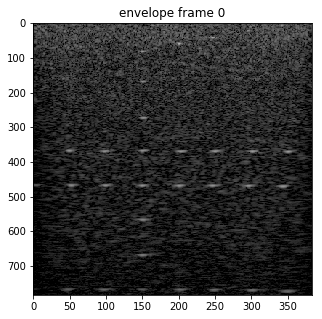

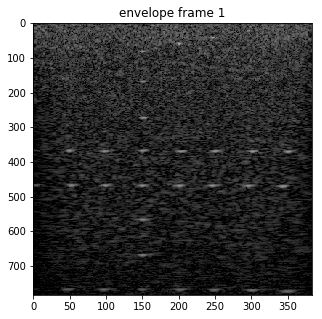

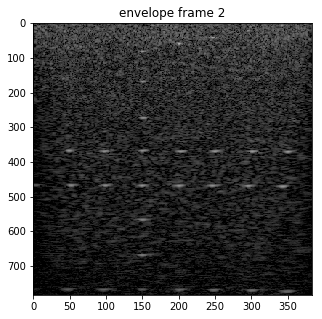

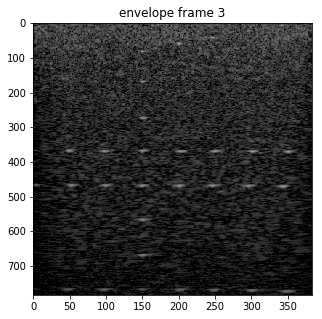

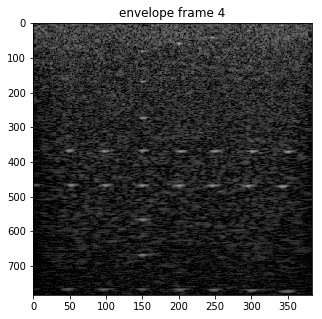

...

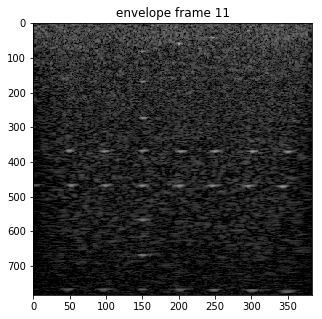

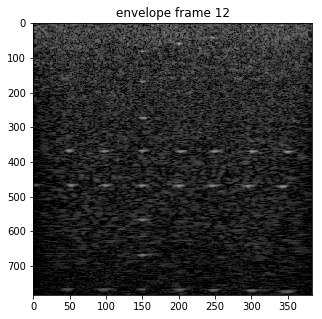

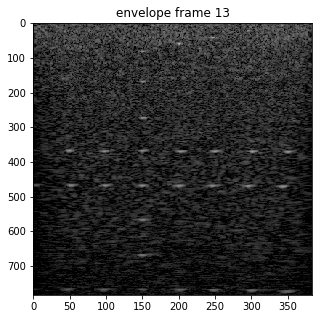

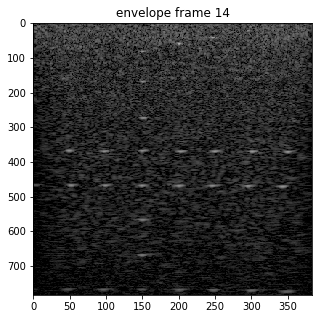

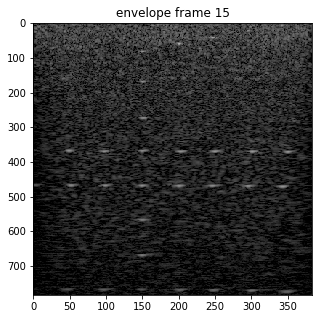

In [53]:
# display b data
numframes = hdr['frames']

# display images
for frame in range(numframes):
    plt.figure(figsize=(5,5))
    plt.imshow(np.transpose(data[:,:,frame]), cmap=plt.cm.gray, aspect='auto', vmin=0, vmax=255 )
    plt.title('envelope frame ' + str(frame))
    plt.show()